# 2-b: Visualizing Neural Networks



In [ ]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
import random
import numpy as np
from scipy.ndimage.filters import gaussian_filter1d
import matplotlib.pyplot as plt
from PIL import Image
import os
from tqdm import tqdm

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'viridis'

<ipython-input-1-1210d4d80b65>:7: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


## Functions and useful variables

In [ ]:
SQUEEZENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
SQUEEZENET_STD = np.array([0.229, 0.224, 0.225], dtype=np.float32)

def preprocess(img, size=224):
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize(mean=SQUEEZENET_MEAN.tolist(),
                    std=SQUEEZENET_STD.tolist()),
        transforms.Lambda(lambda x: x[None]),  # add one dimension
    ])
    return transform(img)

def deprocess(img, should_rescale=True):
    transform = transforms.Compose([
        transforms.Lambda(lambda x: x[0]),
        transforms.Normalize(mean=[0, 0, 0], std=(1.0 / SQUEEZENET_STD).tolist()),
        transforms.Normalize(mean=(-SQUEEZENET_MEAN).tolist(), std=[1, 1, 1]),
        transforms.Lambda(rescale) if should_rescale else transforms.Lambda(lambda x: x),
        transforms.ToPILImage(),
    ])
    return transform(img)

def rescale(x):
    low, high = x.min(), x.max()
    x_rescaled = (x - low) / (high - low)
    return x_rescaled

def blur_image(X, sigma=1):
    X_np = X.cpu().clone().detach().numpy()
    X_np = gaussian_filter1d(X_np, sigma, axis=2)
    X_np = gaussian_filter1d(X_np, sigma, axis=3)
    X.copy_(torch.Tensor(X_np).type_as(X))
    return X

def jitter(X, ox, oy):
    """
    Helper function to randomly jitter an image.

    Inputs
    - X: PyTorch Tensor of shape (N, C, H, W)
    - ox, oy: Integers giving number of pixels to jitter along W and H axes

    Returns: A new PyTorch Tensor of shape (N, C, H, W)
    """
    if ox != 0:
        left = X[:, :, :, :-ox]
        right = X[:, :, :, -ox:]
        X = torch.cat([right, left], dim=3)
    if oy != 0:
        top = X[:, :, :-oy]
        bottom = X[:, :, -oy:]
        X = torch.cat([bottom, top], dim=2)
    return X

## Load the model

For this TME, we will use the Squeezenet model which is a light model pre-trained on ImageNet. This model will be frozen: the goal is not to modify or train the weights but to study them.

In [ ]:
# Load the model
model = torchvision.models.squeezenet1_1(pretrained=True)

# Model in test mode
model.eval()

# Freeze the weights
for param in model.parameters():
    param.requires_grad = False

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
layers = np.array([module for module in model.modules() if not isinstance(module, nn.Sequential)])
layers

array([SqueezeNet(
         (features): Sequential(
           (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2))
           (1): ReLU(inplace=True)
           (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
           (3): Fire(
             (squeeze): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1))
             (squeeze_activation): ReLU(inplace=True)
             (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
             (expand1x1_activation): ReLU(inplace=True)
             (expand3x3): Conv2d(16, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
             (expand3x3_activation): ReLU(inplace=True)
           )
           (4): Fire(
             (squeeze): Conv2d(128, 16, kernel_size=(1, 1), stride=(1, 1))
             (squeeze_activation): ReLU(inplace=True)
             (expand1x1): Conv2d(16, 64, kernel_size=(1, 1), stride=(1, 1))
             (expand1x1_activation): ReLU(inplace=True)
             (expand3x3): Conv2d

## Load example images

This will fill the variables `X, y, class_names` with 25 examples from the validation set of ImageNet. `X` containes the images, `y` the class index of each image, and `class_names` a dictionary giving the class name from its index.

In [ ]:
# Download data
#!wget https://github.com/cdancette/deep-learning-polytech-tp6-7/raw/master/tp9/imagenet_val_25.npz
!wget https://github.com/rdfia/rdfia.github.io/raw/master/data/3-b/imagenet_val_25.npz

--2023-11-22 16:23:07--  https://github.com/rdfia/rdfia.github.io/raw/master/data/3-b/imagenet_val_25.npz
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-b/imagenet_val_25.npz [following]
--2023-11-22 16:23:07--  https://raw.githubusercontent.com/rdfia/rdfia.github.io/master/data/3-b/imagenet_val_25.npz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3940548 (3.8M) [application/octet-stream]
Saving to: ‘imagenet_val_25.npz.1’

imagenet_val_25.npz 100%[===================>]   3.76M  --.-KB/s    in 0.09s   

2023-11-22 16:23:07 (43.1 MB/s) - ‘imagenet_val_25.npz

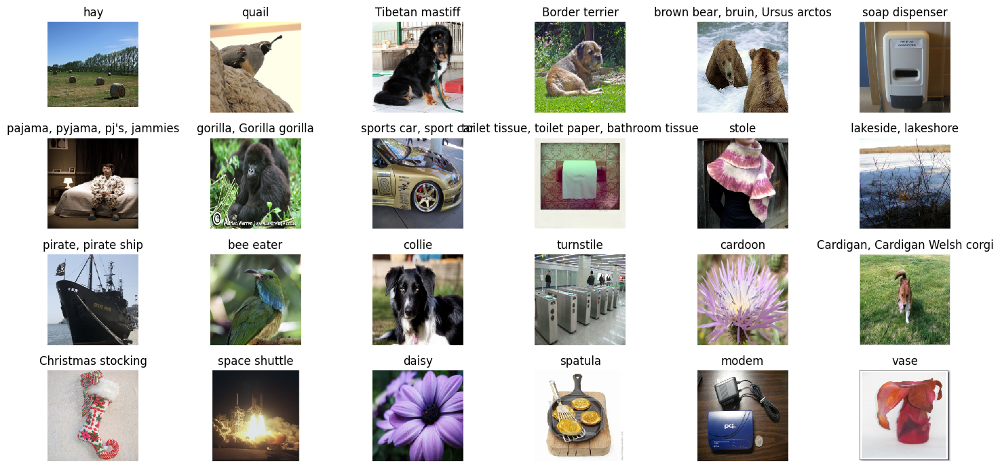

In [ ]:
f = np.load("imagenet_val_25.npz", allow_pickle=True)
X, y, class_names = f["X"], f["y"], f["label_map"].item()
class_names_to_id = {name: id for id, name in class_names.items()}

plt.figure(figsize=(15, 7))
for i in range(24):
    plt.subplot(4, 6, i + 1)
    plt.imshow(X[i])
    plt.title(class_names[y[i]])
    plt.axis('off')
plt.gcf().tight_layout()

# Saliency Maps

Calculate the saliency map for 5 examples out of the 25 loaded ones following the instructions of the TP guide.

**Hint :** To choose 1 particular value in each row of a matrix, you can do this:

```python
x = torch.Tensor([[0.1, 0.0, 0.5, 0.1, 0.1],
                  [0.0, 0.1, 0.0, 0.6, 0.2],
                  [0.7, 0.1, 0.1, 0.3, 0.0]])
x[np.arange(3), [2, 3, 0]]
# 0.5000
# 0.6000
# 0.7000
#[torch.FloatTensor of size 3]
```

In [ ]:
def compute_saliency_maps(X, y, model):
    """
    Compute a class saliency map using the model for images X and labels y.

    Input:
    - X: Input images; Tensor of shape (N, 3, H, W)
    - y: Labels for X; LongTensor of shape (N,)
    - model: A pretrained CNN that will be used to compute the saliency map.

    Returns:
    - saliency: A Tensor of shape (N, H, W) giving the saliency maps for the input
    images.
    """
    # activate gradients on X
    X.requires_grad = True
    saliency = None

    ##############################################################################
    # TODO: Implement this function. Perform a forward and backward pass through #
    # the model to compute the gradient of the correct class score with respect  #
    # to each input image.                                                       #
    # You first want to extract the logits for the correct scores (not the loss),
    # and then compute the gradients with a backward pass.

    # forward pass to get logits --> without softmax?
    y_hat = model(X)
    logits = y_hat
    #print(logits)

    # logits for correct class
    correct_logits = logits.gather(1, y.view(-1, 1)).squeeze() #alternatively for example .where()
    #print(correct_logits) one logit per image, gather along dimension 1, not along batches!

    # backward
    correct_logits.backward(torch.ones_like(correct_logits))

    # saliency map
    # take absolute value of gradient with respect to input image (we don't care about the sign)
    saliency = X.grad.abs()

    return saliency.max(dim=1)[0] # give out max pooled image across channels

tensor(24.1313, grad_fn=<SqueezeBackward0>)


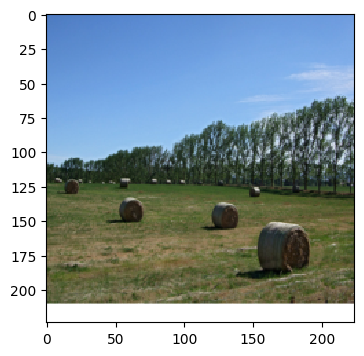

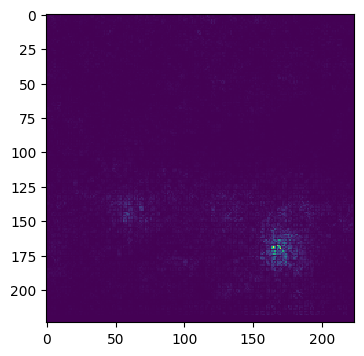

In [ ]:
# test saliency map
X_sample = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0)[0:1]
y_sample = torch.LongTensor(y)[0:1]

saliency_sample = compute_saliency_maps(X_sample, y_sample, model)[0].numpy()

plt.figure(figsize = (4, 4))
plt.imshow(X[0])
plt.show()
plt.figure(figsize = (4, 4))
plt.imshow(saliency_sample)
plt.show()

Test your code with the following function:

In [ ]:
def show_saliency_maps(X, y, model):
    # Convert X and y from numpy arrays to Torch Tensors
    X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0)
    y_tensor = torch.LongTensor(y)

    # Compute saliency maps for images in X
    saliency = compute_saliency_maps(X_tensor, y_tensor, model)

    # Convert the saliency map from Torch Tensor to numpy array and show images
    # and saliency maps together.
    saliency = saliency.numpy()
    N = X.shape[0]
    for i in range(N):
        plt.subplot(2, N, i + 1)
        plt.imshow(X[i])
        plt.axis('off')
        plt.title(class_names[y[i]])
        plt.subplot(2, N, N + i + 1)
        plt.imshow(saliency[i], cmap=plt.cm.hot)
        plt.axis('off')
        plt.gcf().set_size_inches(12, 5)
    plt.show()

#### Question 1 - Show and interpret the results

tensor([24.1313, 25.1475, 38.8825, 25.4514, 30.2724],
       grad_fn=<SqueezeBackward0>)


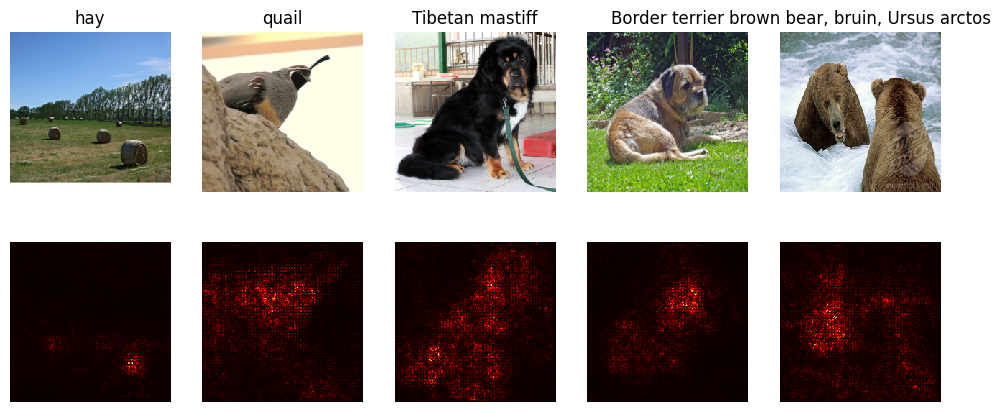

tensor([25.4353, 15.6568, 34.9214, 22.9094, 13.7762],
       grad_fn=<SqueezeBackward0>)


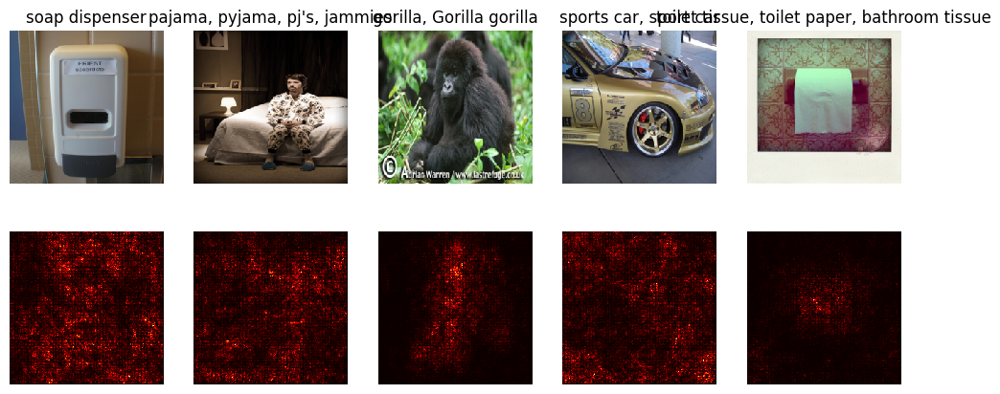

tensor([18.1419, 10.5448, 23.5066, 46.3714, 39.0091],
       grad_fn=<SqueezeBackward0>)


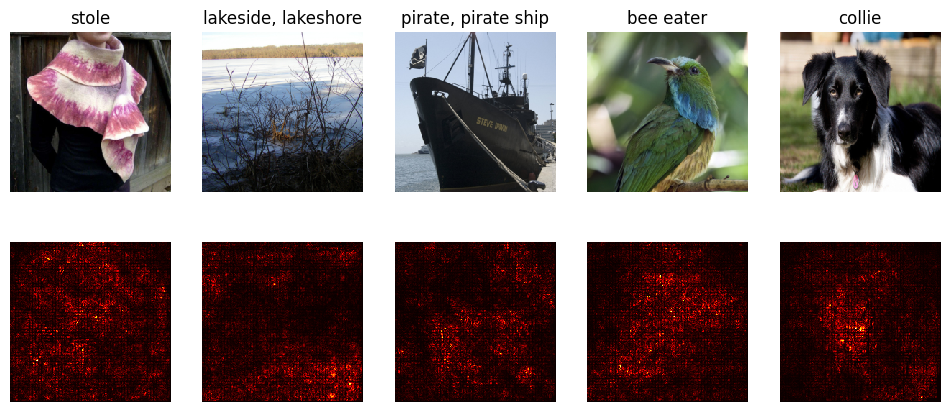

tensor([27.1299, 25.8614, 19.7288, 18.6807, 20.9641],
       grad_fn=<SqueezeBackward0>)


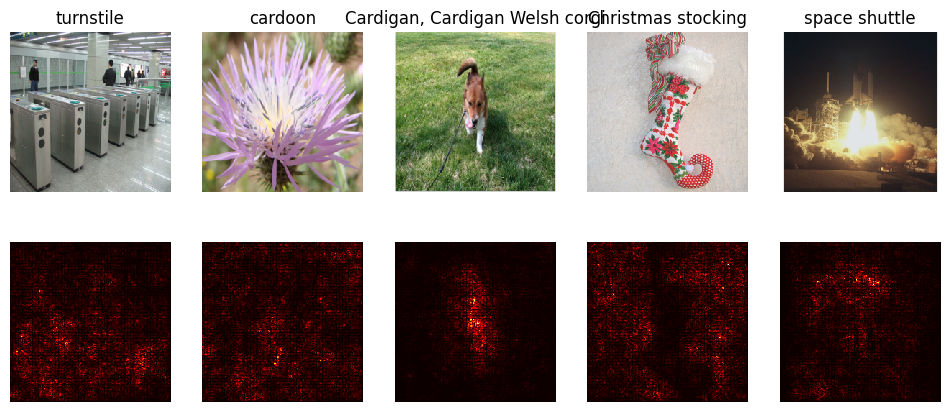

tensor([25.2686, 18.7046, 21.7245, 12.6422, 15.0523],
       grad_fn=<SqueezeBackward0>)


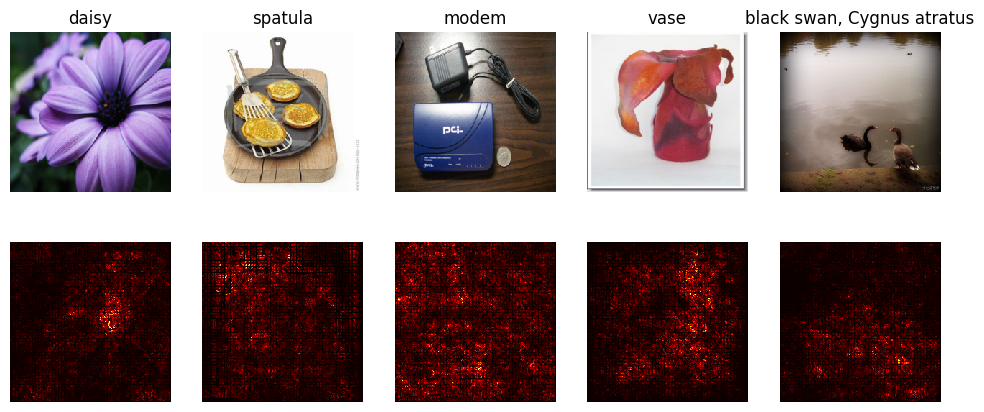

In [ ]:
for i in range(5): # pour tester toutes les images
    show_saliency_maps(X[5*i:5*i+5], y[5*i:5*i+5], model)

The saliency map in general conforms to our guess of where one would look in order to identify the object in an image. For example in the case of the class 'daisy', we have high saliency at the disk flowers surrounded by elevated activation in the region of the petals and low to none in the background. <br>

Interestingly, the pixels that contribute to the class score are highly localized for some classes (e.g. Cardigan Welsh, hay, ...) whereas for other, such as 'modem' or 'spatula' , the contributing pixel region is spread out or covers almost the entire image. In this case, the network might have learned to identifiy assosciated objects that then by induction help to predict the desired class. We hypothesize that for example in the case of 'spatula' the network's filter also activate for 'pancakes' or 'pan' because these objects typically are co-occuring.

#### Question 2 - Limits of this technique of visualizing the impact of different pixels


This technique is good at showing the impact of a single pixel but doesn't make any statement about interactions between pixels (pairwise influence).

#### Question 3 - Can this technique be used for a different purpose than interpreting the network?

One idea how to repurpose the saliency map would be for object detection. As the saliency activation is in most cases limited to the region where we - as humans - localize the object within the frame, we could use the saliency pixels to find the bounding boxes for our target objects.

#### Question 4 (Bonus) - Test with a different network, for example VGG16

In [ ]:
# Load the model
model_vit = torchvision.models.vit_b_16(pretrained=True)

# Model in test mode
model_vit.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

tensor([8.9042, 9.1326, 9.3342, 8.9207, 9.1240], grad_fn=<SqueezeBackward0>)


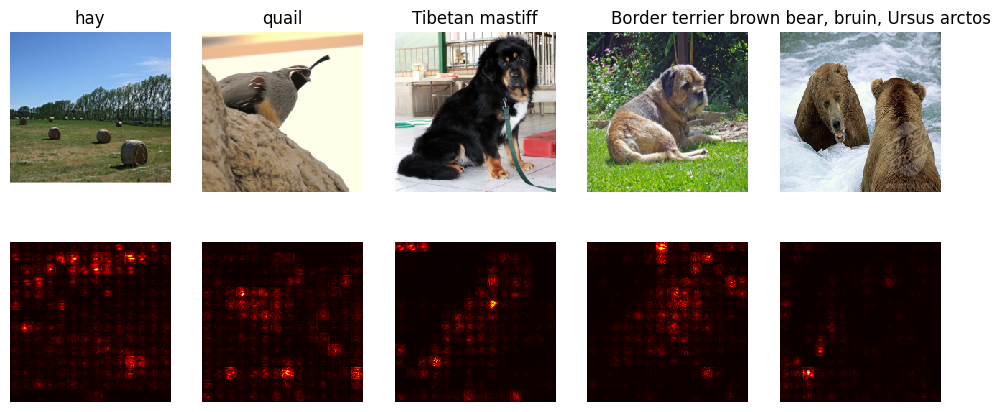

tensor([10.5515, 10.2058,  9.2447,  8.5257,  8.8044],
       grad_fn=<SqueezeBackward0>)


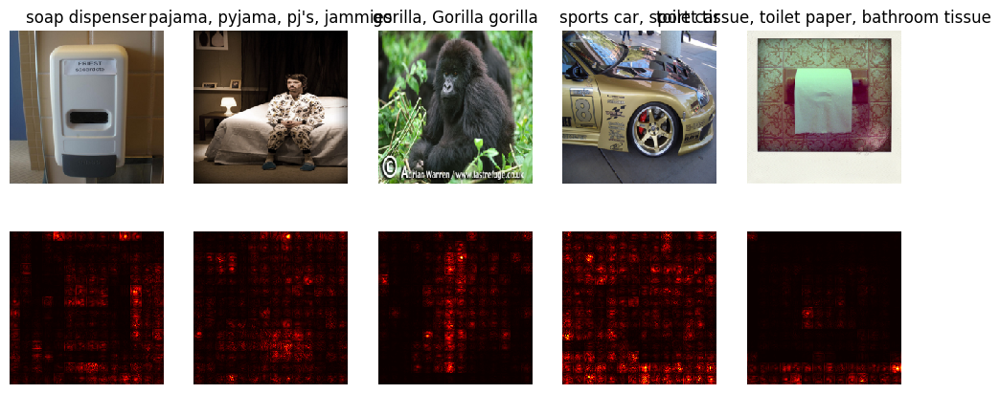

tensor([8.8305, 8.7860, 8.6306, 8.9639, 7.4404], grad_fn=<SqueezeBackward0>)


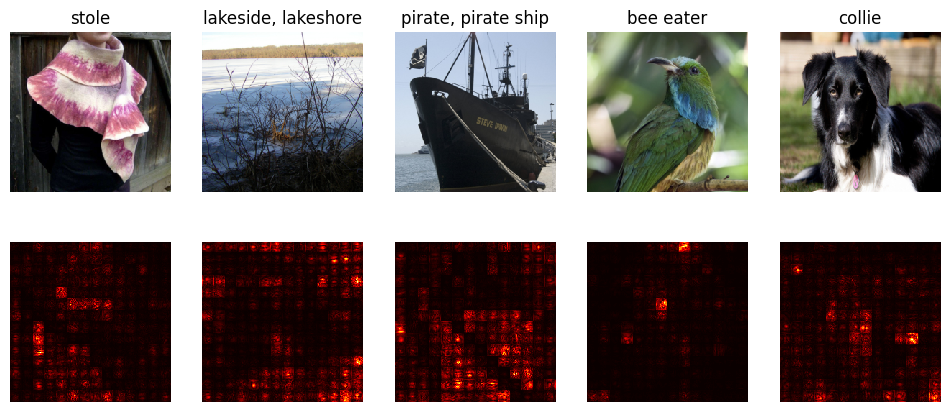

tensor([8.9572, 9.0790, 8.2717, 8.4954, 8.8756], grad_fn=<SqueezeBackward0>)


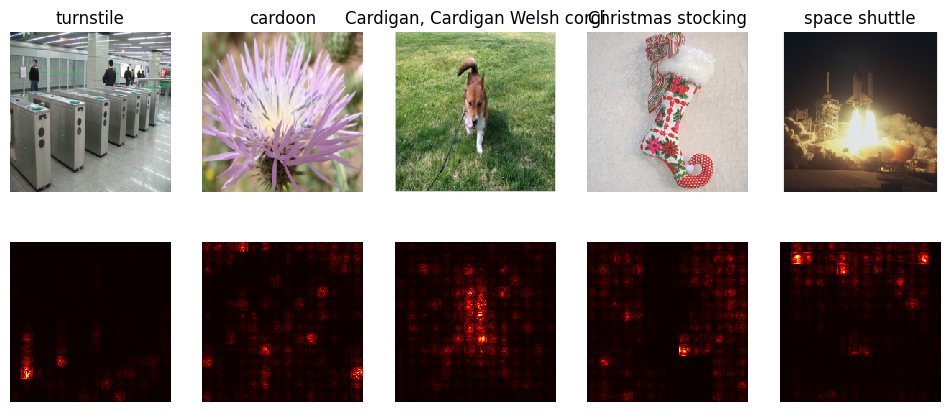

tensor([9.0944, 8.1766, 9.4087, 7.1545, 8.9408], grad_fn=<SqueezeBackward0>)


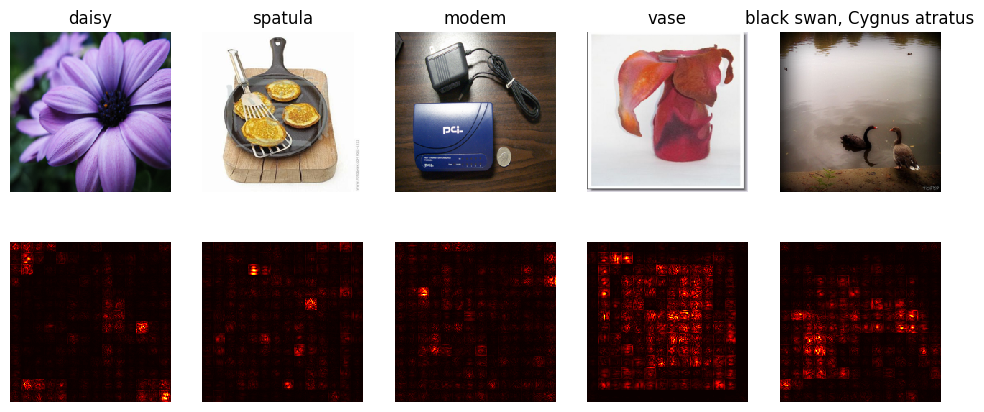

In [ ]:
for i in range(5): # pour tester toutes les images
    show_saliency_maps(X[5*i:5*i+5], y[5*i:5*i+5], model = model_vit)

The vision transformer clearly shows a different picture and we can even see the 'an image is worth 16x16 words' idea ...

# Adversarial Examples (Fooling Images)

Write the code to calculate an image such that it will be classified in a `target_y` different from the real class (by modifying the image and not the network parameters). See the TP guide for instructions.

**The first two blocks will allow you to perform tests in an interactive way** to write and test your code. Once your code seems to work, complete the function in the 3rd block and test on various images in the 4th block.

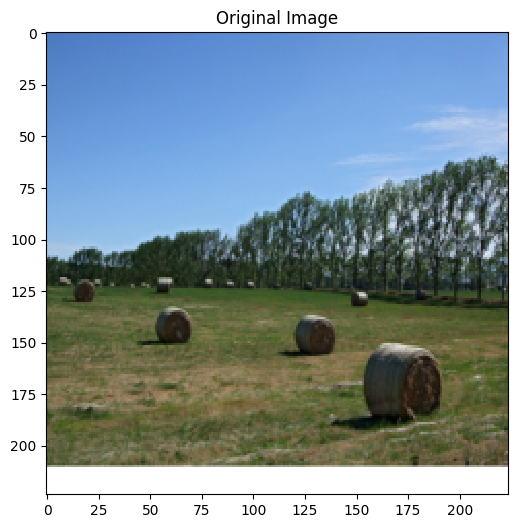

In [ ]:
# Initialize tests
X_tensor = torch.Tensor(preprocess(Image.fromarray(X[0])))
target_y = class_names_to_id['stingray']  # Desired class
X_fooling = X_tensor.clone()
X_fooling.requires_grad = True
learning_rate = 1

plt.figure(figsize = (6,6))
plt.title('Original Image')
plt.imshow(np.asarray(deprocess(X_tensor.clone())).astype(np.uint8))

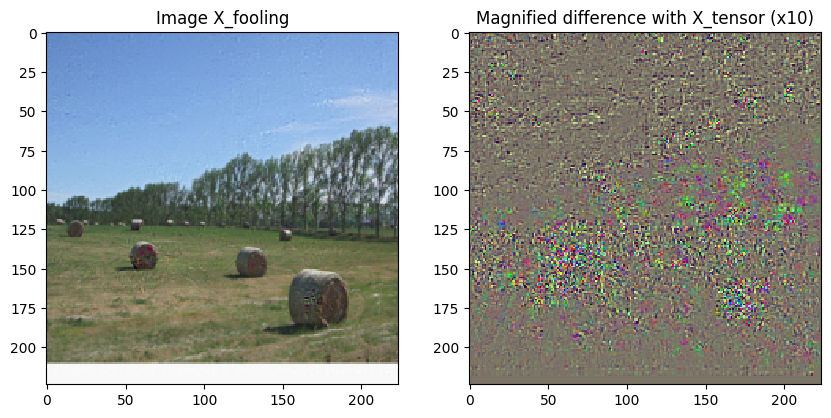

real label: 958
originally predicted label tensor(958)
fooled target label: 6
fooled label tensor(344)


In [ ]:
# TODO write your code to test here

# get class predicted by network
y_hat = model(X_fooling) # all class scores

y_hat_j  = y_hat[0, target_y] # only target class score

model.zero_grad()
y_hat_j.backward() # construct computational graph for class label y_j

with torch.no_grad(): # calculate gradient in separate environment
  dyj_dx = X_fooling.grad /X_fooling.grad.norm() # normalize gradient
  X_fooling += 20*learning_rate * dyj_dx

X_fooling.grad.zero_()


# Visualize the image X_folling and its modifications
plt.subplot(1, 2, 1)
plt.imshow(np.asarray(deprocess(X_fooling.clone())).astype(np.uint8))
plt.title("Image X_fooling")
plt.subplot(1, 2, 2)
plt.imshow(np.asarray(deprocess(10* (X_fooling - X_tensor), should_rescale=False)))
plt.title("Magnified difference with X_tensor (x10)")
plt.show()

print('real label:', y[0])
print('originally predicted label', torch.argmax(model(X_tensor)))
print('fooled target label:', target_y)
print('fooled label', torch.argmax(model(X_fooling)))


In [ ]:
def make_fooling_image(X, target_y, model):
    """
    Generate a fooling image that is close to X, but that the model classifies
    as target_y.

    Inputs:
    - X: Input image; Tensor of shape (1, 3, 224, 224)
    - target_y: An integer in the range [0, 1000)
    - model: A pretrained CNN

    Returns:
    - X_fooling: An image that is close to X, but that is classifed as target_y
    by the model.
    """

    X_fooling = X.clone()
    X_fooling.requires_grad = True

    for i in range(0, 200):
        # get class predicted by network
        y_hat = model(X_fooling) # all class scores
        y_hat_j  = y_hat[0, target_y] # only target class score

        model.zero_grad()
        y_hat_j.backward() # construct computational graph for class label y_j

        with torch.no_grad(): # calculate gradient in separate environment
          dyj_dx = X_fooling.grad /X_fooling.grad.norm() # normalize gradient
          X_fooling += learning_rate * dyj_dx

        X_fooling.grad.zero_()


    """# Initialize our fooling image to the input image, enable gradients.
    X_fooling = X.clone()
    X_fooling.requires_grad = True

    learning_rate = 1

    # get class predicted by network
    y_hat_j = model(X_fooling)[0, target_y] # only target class score
    scores = model(X_fooling)

    while target_y != scores.data.max(1)[1][0]:
      print(scores.data.max(1)[1][0])
      model.zero_grad()
      y_hat_j.backward(retain_graph=True) # construct computational graph for class label y_j

      with torch.no_grad(): # calculate gradient in separate environment
        dyj_dx = X_fooling.grad /X_fooling.grad.norm() # normalize gradient
        X_fooling -= learning_rate * dyj_dx
        print(X_fooling.size())

      X_fooling.grad.zero_()
      scores = model(X_fooling)"""


    ##############################################################################
    # TODO: Generate a fooling image X_fooling that the model will classify as   #
    # the class target_y. You should perform gradient ascent on the score of the #
    # target class, stopping when the model is fooled.                           #
    # When computing an update step, first normalize the gradient:               #
    #   dX = learning_rate * grad / ||grad||_2                                   #
    #                                                                            #
    # You should write a training loop.                                          #
    #                                                                            #
    # HINT: For most examples, you should be able to generate a fooling image    #
    # in fewer than 100 iterations of gradient ascent.                           #
    # You can print your progress over iterations to check your algorithm.       #
    # HINT: Remember to reset gradients at each step                             #
    # HINT: update shouldn't be tracked by the autograd (see for example         #
    # https://pytorch.org/tutorials/beginner/examples_autograd/two_layer_net_autograd.html#sphx-glr-beginner-examples-autograd-two-layer-net-autograd-py #
    ##############################################################################
    #                             END OF YOUR CODE                               #
    ##############################################################################
    return X_fooling

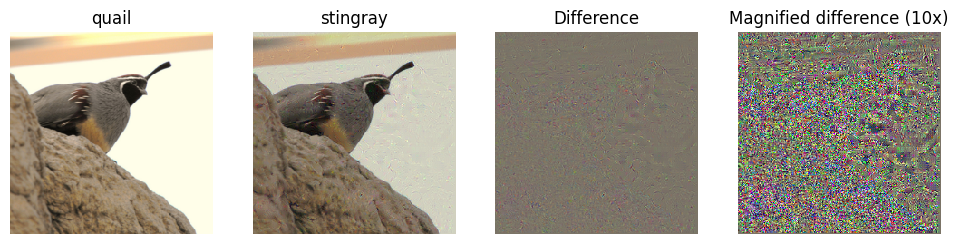

In [ ]:
#@title Question 5 - Show and interpret the obtained results

# Index of the image to modify and the target class
idx = 1
target_y = class_names_to_id['stingray']

# Preparation of tensor X and it's "fooling" version
X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0)
X_fooling = make_fooling_image(X_tensor[idx:idx+1], target_y, model)

# Check the predicted class
scores = model(X_fooling)
assert target_y == scores.data.max(1)[1][0], 'The model is not fooled!'

# Display
X_fooling_np = deprocess(X_fooling.clone())
X_fooling_np = np.asarray(X_fooling_np).astype(np.uint8)

plt.subplot(1, 4, 1)
plt.imshow(X[idx])
plt.title(class_names[y[idx]])
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(X_fooling_np)
plt.title(class_names[target_y])
plt.axis('off')

plt.subplot(1, 4, 3)

X_pre = preprocess(Image.fromarray(X[idx]))
diff = np.asarray(deprocess(X_fooling - X_pre, should_rescale=False))
plt.imshow(diff)
plt.title('Difference')
plt.axis('off')

plt.subplot(1, 4, 4)
diff = np.asarray(deprocess(10 * (X_fooling - X_pre), should_rescale=False))
plt.imshow(diff)
plt.title('Magnified difference (10x)')
plt.axis('off')

plt.gcf().set_size_inches(12, 5)
plt.show()

**Interpretation:** <br>
Although the transformed image looks almost unchanged to the human eye and is still being identified by a human as 'quail', the network has 'mislabeled' it as a stingray due to the marginal differences. The CNN is highly sensitive to small changes in pixel intensity.

In [ ]:
#@title Question 6 - Consequences of this method on CCNs

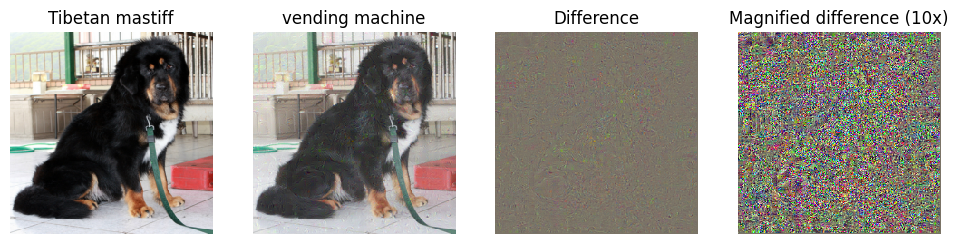

In [ ]:
#@title Question 7 (Bonus) - Test with different input images/target classes

# Index of the image to modify and the target class
idx = 2
target_y = class_names_to_id['vending machine']

#886: 'vending machine'

# Preparation of tensor X and it's "fooling" version
X_tensor = torch.cat([preprocess(Image.fromarray(x)) for x in X], dim=0)
X_fooling = make_fooling_image(X_tensor[idx:idx+1], target_y, model)

# Check the predicted class
scores = model(X_fooling)
assert target_y == scores.data.max(1)[1][0], 'The model is not fooled!'

# Display
X_fooling_np = deprocess(X_fooling.clone())
X_fooling_np = np.asarray(X_fooling_np).astype(np.uint8)

plt.subplot(1, 4, 1)
plt.imshow(X[idx])
plt.title(class_names[y[idx]])
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(X_fooling_np)
plt.title(class_names[target_y])
plt.axis('off')

plt.subplot(1, 4, 3)

X_pre = preprocess(Image.fromarray(X[idx]))
diff = np.asarray(deprocess(X_fooling - X_pre, should_rescale=False))
plt.imshow(diff)
plt.title('Difference')
plt.axis('off')

plt.subplot(1, 4, 4)
diff = np.asarray(deprocess(10 * (X_fooling - X_pre), should_rescale=False))
plt.imshow(diff)
plt.title('Magnified difference (10x)')
plt.axis('off')

plt.gcf().set_size_inches(12, 5)
plt.show()

# Class visualization

Write the code which generates an image maximizing the score of a class, subject to a certain number of regularizations. See the TP guide for details.


In [ ]:
def create_class_visualization(target_y, model, dtype, init_img=None, l2_reg=1e-3, learning_rate=5,
                               num_iterations=200, blur_every=10, max_jitter=16, show_every=25):
    """
    Generate an image to maximize the score of target_y under a pretrained model.

    Inputs:
    - target_y: Integer in the range [0, 1000) giving the index of the class
    - model: A pretrained CNN that will be used to generate the image
    - dtype: Torch datatype to use for computations

    Keyword arguments:
    - init_img: Initial image to use (if None, will be random)
    - l2_reg: Strength of L2 regularization on the image
    - learning_rate: How big of a step to take
    - num_iterations: How many iterations to use
    - blur_every: How often to blur the image as an implicit regularizer
    - max_jitter: How much to gjitter the image as an implicit regularizer
    - show_every: How often to show the intermediate result
    """

    model.type(dtype)

    # Randomly initialize the image as a PyTorch Tensor
    if init_img is None:
        img = torch.randn(1, 3, 224, 224).mul_(1.0).type(dtype).detach()
    else:
        img = init_img.clone().mul_(1.0).type(dtype).detach()
    img.requires_grad = True

    for t in range(num_iterations):
        # Randomly jitter the image a bit; this gives slightly nicer results
        ox, oy = random.randint(0, max_jitter), random.randint(0, max_jitter)
        img = (jitter(img, ox, oy)).clone().detach()
        img.requires_grad = True

        ########################################################################
        # - TODO: Use the model to compute the gradient of the score for the   #
        # class target_y with respect to the pixels of the image, and make a   #
        # gradient step on the image using the learning rate. Don't forget the #
        # L2 regularization term!                                              #
        # - Be very careful about the signs of elements in your code.          #
        # - Advice: compute backward on the raw logits (not the loss), it      #
        # works better                                                         #
        ########################################################################

        scores = model(img)
        score_target_class = scores[0, target_y]

        # regularization term
        reg_term = l2_reg * torch.norm(img) / img.norm()
        # loss
        loss = score_target_class - reg_term

        model.zero_grad()
        loss.backward()


        with torch.no_grad():
            dX = learning_rate * img.grad / img.grad.norm()

            # Update the image
            img.data += dX

            # set gradients to zero for next iteration
            img.grad.zero_()

            # Undo the random jitter
            img.data.copy_(jitter(img, -ox, -oy))
            img = img.clone()  # loose computation path by .clone() operation

            # Optional: Clamp the image values to stay within a valid range
            img.data = torch.clamp(img.data, 0, 1)

            # Optional: Blur the image as a regularizer
            if t % blur_every == 0:
                img.data = blur_image(img.data, sigma=0.5)



        ########################################################################
        #                             END OF YOUR CODE                         #
        ########################################################################

        # Undo the random jitter
        img.data.copy_(jitter(img, -ox, -oy))
        img = img.clone()

        # As regularizer, clamp and periodically blur the image
        for c in range(3):
            lo = float(-SQUEEZENET_MEAN[c] / SQUEEZENET_STD[c])
            hi = float((1.0 - SQUEEZENET_MEAN[c]) / SQUEEZENET_STD[c])
            img[:, c].clamp_(min=lo, max=hi)

        if t % blur_every == 0:
            blur_image(img, sigma=0.5)

        # Periodically show the image
        if t == 0 or (t + 1) % show_every == 0 or t == num_iterations - 1:
            plt.imshow(deprocess(img.clone().cpu()))
            class_name = class_names[target_y]
            plt.title('%s\nIteration %d / %d' % (class_name, t + 1, num_iterations))
            plt.gcf().set_size_inches(4, 4)
            plt.axis('off')
            plt.gcf().tight_layout()
            plt.show()

    return deprocess(img.cpu())

Test with various classes and starting from random noise:

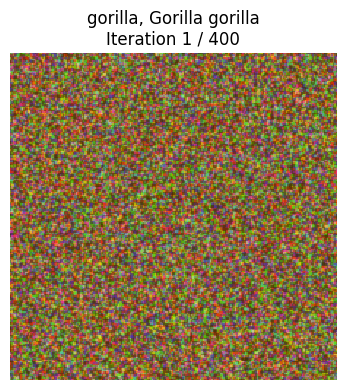

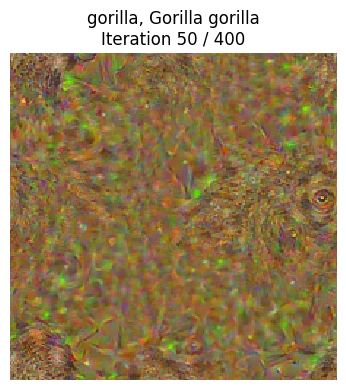

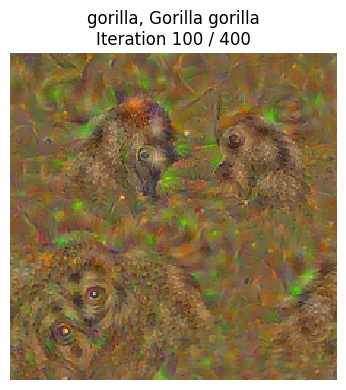

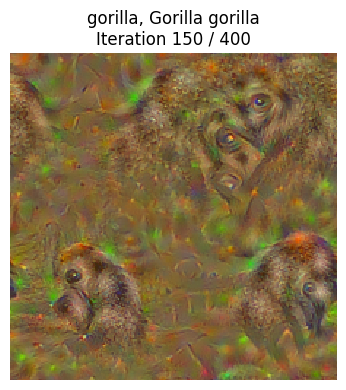

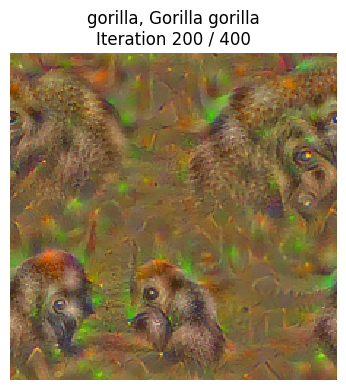

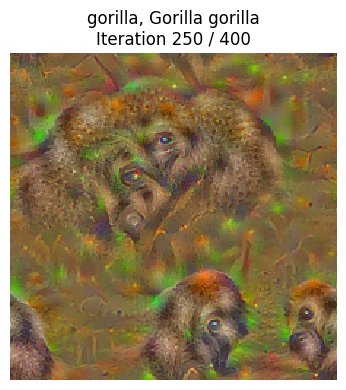

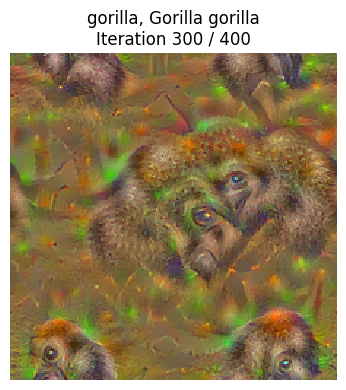

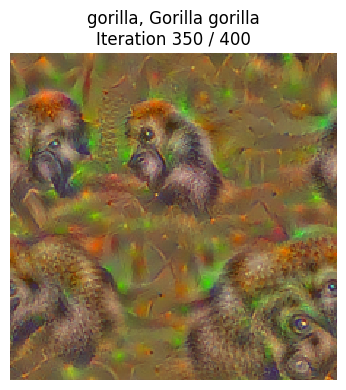

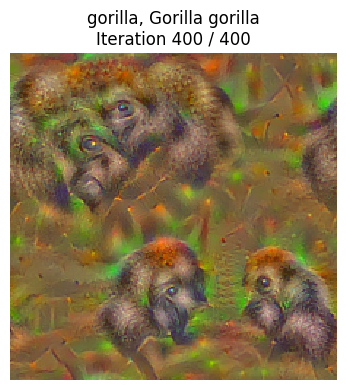

In [ ]:
#@title Question 8 - Show and interpret obtained results

dtype = torch.FloatTensor
# dtype = torch.cuda.FloatTensor # Uncomment this to use GPU
model.type(dtype)

#target_y = 76 # Tarantula
# target_y = 78 # Tick
# target_y = 187 # Yorkshire Terrier
#target_y = 683 # Oboe
target_y = 366 # Gorilla
# target_y = 604 # Hourglass
# target_y = 113 # Snail
# target_y = np.random.randint(1000) # Classe aléatoire
out = create_class_visualization(target_y, model, dtype, show_every=50, num_iterations=400, l2_reg=1e-2)

**Interpretation**

texyt

In [ ]:
#@title Question 9 - Adjust training parameters for class visualization

N_ITER = 500
L2_REG = 1e-2


Test by starting from an image from ImageNet:

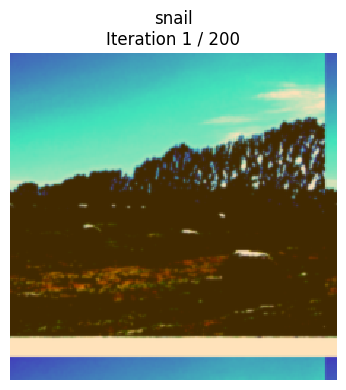

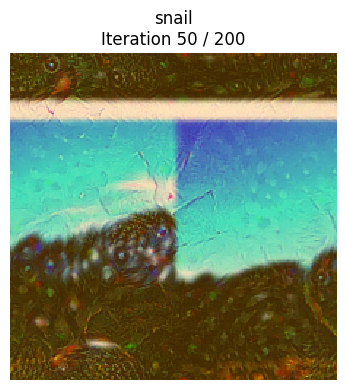

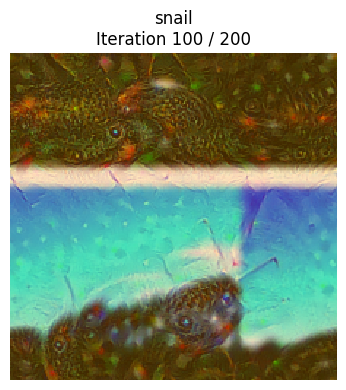

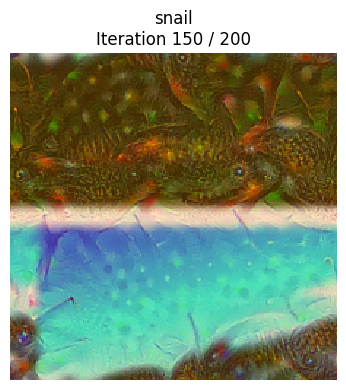

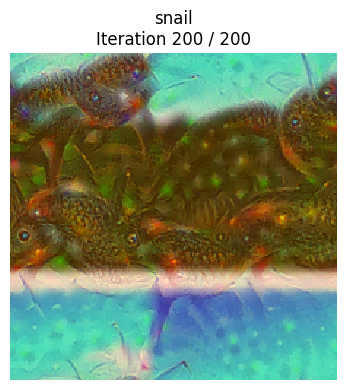

In [ ]:
#@title Question 10 - Class visualization on ImageNet image

# Initialize test
img_ind = 0

target_y = 113 # snail
X_tensor = torch.Tensor(preprocess(Image.fromarray(X[img_ind])))
out = create_class_visualization(target_y, model, dtype, init_img=X_tensor, show_every=50, num_iterations=200)